# Week 5

Yay! It's week 5. One Assignment down. Look at how far you've already come. 

## Today

But there's an entire aspect of the data that we haven't used much. The geospatial aspect. That's basically all we'll be doing today. This lecture covers:

1. **Choropleth maps with Plotly**: You'll learn to visualize SF police districts using color-coded shapefiles, starting from random data and building up to real crime statistics.
2. **Interactive maps with Folium**: A second mapping library — you'll create point scatter maps, heatmaps, and an animated "movie" showing how crime patterns shift over time.
3. **Putting it all together**: An open-ended spatio-temporal analysis where you apply the full toolkit you've built over the past weeks to understand a single crime type in depth.

## Part 1: Visualizing geodata with Plotly

So visualizing geodata used to be difficult, but with `Plotly` things have gotten easier. 

Like matplotlib, Plotly is an [open-source data visualization library](https://plotly.com/python/), but it's aimed at making interactive visualizations that can be rendered in a web browser (or jupyter notebook). You can read about it and learn how to install it [here](https://plotly.com/python/getting-started/).

That means that we can easily draw on the fact that the crime data has lots of exciting geo-data attached. The map we're going to be creating is called a **[choropleth map](https://en.wikipedia.org/wiki/Choropleth_map)** (more on these later), which is basically a map, where we color in shapefiles (more on this below) based on some value that we care about. We'll take our inspiration from Plotly's gentle intro to [Choropleth maps](https://plotly.com/python/mapbox-county-choropleth/)

Back in Week 3, you computed `P(crime|district)/P(crime)` ratios to compare crime profiles across SF's police districts. You had numbers — but numbers alone can't reveal the geographic patterns hidden across the 10 districts. This week, we'll take that analysis one step further: instead of just reading off ratios, we'll put those patterns directly on a map.

The thing we want to look into is the SF police districts, shown below (image stolen from [this page](https://hoodline.com/2015/07/citywide-sfpd-redistricting-to-take-effect-sunday/)).

![districts from web](https://raw.githubusercontent.com/suneman/socialdata2021/master/files/sfpdfinal.png)

But because we are cool programmers, we want to create our own maps, **with our own information on them**. Let's do it!

> *Exercise 1.1*: Let's plot a map with some random values in it. <font color="gray"></font>

<div class="alert alert-block alert-info">
There are many new concepts to understand, and doing the exercise yourself is the best way to begin to get the nitty-gritty details of maps and shapefiles under your skin. Once you get the idea of shapefiles and how they work into your human head, it will unlock new & powerful ways of thinking.
</div>

> What we need to do to get going is some random data. Below is a little dictionary with a random value for each district.

In [1]:
randomdata = {
    "CENTRAL": 0.4821,
    "SOUTHERN": 0.9153,
    "BAYVIEW": 0.3674,
    "MISSION": 0.7542,
    "PARK": 0.6285,
    "RICHMOND": 0.2147,
    "INGLESIDE": 0.05391,
    "TARAVAL": 0.007846,
    "NORTHERN": 0.4938,
    "TENDERLOIN": 0.08127,
}

> *Exercise 1.1* (continued):
>
> For this exercise, we'll use the random values above and we'll also need some *shape-files*.
> [Shapefiles can have many different formats](https://en.wikipedia.org/wiki/Shapefile). Because we are brilliant teachers and an all-round standup people, we are sharing the shapefiles as [`geojson`](https://en.wikipedia.org/wiki/GeoJSON), which is an easy-to-use format for shapefiles based on `json`.
>
> * Download the SFPD District shapefiles **[here](https://raw.githubusercontent.com/suneman/socialdata2025/main/files/sfpd.geojson)**
> * Now that you have the shapefiles, you can follow the example here: https://plotly.com/python/mapbox-county-choropleth/ but with the following modifications:
>    * In the example the `id` is a so-called FIPS code. In our case the `id` is the `DISTRICT`
>    * You will have to convert the dictionary of random values I included above to a Pandas dataframe with the right column headings.
>    * The data used in the example has a range between zero and 12. Your data is between $[0,1]$. So you'll need to modify the plotting command to accound for that change.
>    * You should also change the map to display the right zoom level.
>    * And the map should center on San Francisco's `lat` and `lon`.
> * Now you can create your map.

Mine looks something like this (but I've changed the random values to make it more fun, so expect your colors to be different.).



<img src="https://raw.githubusercontent.com/suneman/socialdata2025/main/files/map_example.png" alt="example" style="width:800px;"/>

You're encouraged to play around with other settings, color schemes, etc.

In [2]:
# Exercise 1.1: Plot SF map with plotly with the random values
import plotly.express as px
import pandas as pd
import json
import urllib.request

# 1. Load the GeoJSON shapefile for SF police districts
url = "https://raw.githubusercontent.com/suneman/socialdata2025/main/files/sfpd.geojson"
with urllib.request.urlopen(url) as response:
    geojson = json.load(response)

# 2. Convert the randomdata dict to a DataFrame with named columns
df = pd.DataFrame(list(randomdata.items()), columns=["district", "value"])

# 3. Create the choropleth map
fig = px.choropleth_map(
    data_frame=df,
    geojson=geojson,
    locations="district",  # column in df to match against the GeoJSON id
    featureidkey="properties.DISTRICT",  # path to the id field inside each GeoJSON feature
    color="value",
    color_continuous_scale="Viridis",
    range_color=[0, 1],
    map_style="open-street-map",  # Or "carto-positron"
    zoom=11,
    center={"lat": 37.757, "lon": -122.449},  # centre on San Francisco
    opacity=0.55,
    labels={"value": "Random Value"},
    title="SF Police Districts - Random Values",
)
fig.update_layout(margin={"r": 0, "t": 40, "l": 0, "b": 0})
fig.show()

> *Exercise 1.2*: Now let's replace the random values with something real.
>
> You already computed `P(crime|district)/P(crime)` ratios in Week 3 — a measure of how much each district deviates from the city-wide average for a given crime type. Let's put one of those ratio sets on a map.
>
> * Pick one of your Personal Focus Crimes.
> * Compute `P(crime|district)/P(crime)` for each of the 10 SF police districts (just as you did in Week 3, Exercise 2.1).
> * Replace the `randomdata` dictionary with your computed ratios, using the same district names as keys.
> * Re-run your choropleth. Remember to update the color scale range to match your new data.
> * Comment on what you see. Does the geographic pattern match your intuition from Week 3? Is it easier to read the pattern on a map than in a bar chart? What's new/different?
>     * Hint 1: Remember the color bar! Without it we can't make sense of the data.
>     * Hint 2: Because the value 1 is special for ratios (it means "same as the city average"), it's meaningful to use a **diverging color scale** — e.g. increasingly red for values above 1 and increasingly blue for values below 1. That makes the map much easier to parse because the colors align with the "idea" of the underlying numbers.

<div class="alert alert-block alert-info">
It's OK to use your LLM to help with the data wrangling here. The interpretation should be your own.
</div>

In [3]:
# Exercise 1.2: ratio for 1 of the focus crimes
import numpy as np

merged_df = pd.read_csv("data/sf_crime_merged_2003_present.csv")
POLICE_DISTRICTS = [
    "Tenderloin",
    "Bayview",
    "Southern",
    "Richmond",
    "Mission",
    "Northern",
    "Park",
    "Taraval",
    "Ingleside",
    "Central",
]
CRIME_TYPE = "Assault"

# P(crime) = fraction of ALL crimes that are Assault
p_crime = (merged_df["Unified Category"] == CRIME_TYPE).mean()
# P(crime|district) / P(crime) for each district
assault_ratios = {}
for district in POLICE_DISTRICTS:
    district_df = merged_df[merged_df["Police District"] == district]
    if len(district_df) == 0:
        assault_ratios[district.upper()] = np.nan
        continue
    p_crime_given_district = (district_df["Unified Category"] == CRIME_TYPE).mean()
    assault_ratios[district.upper()] = p_crime_given_district / p_crime

print(assault_ratios)

{'TENDERLOIN': np.float64(1.4814600716983246), 'BAYVIEW': np.float64(1.288838426503035), 'SOUTHERN': np.float64(0.9855819470101216), 'RICHMOND': np.float64(0.6548777229491215), 'MISSION': np.float64(1.2039318672642652), 'NORTHERN': np.float64(0.7991825064087207), 'PARK': np.float64(0.7619244155324637), 'TARAVAL': np.float64(0.8397377632719821), 'INGLESIDE': np.float64(1.1590376413965722), 'CENTRAL': np.float64(0.8047647786253148)}


In [4]:
df_ratios = pd.DataFrame(list(assault_ratios.items()), columns=["district", "ratio"])
max_val = df_ratios["ratio"].max()

fig = px.choropleth_map(
    data_frame=df_ratios,
    geojson=geojson,
    locations="district",
    featureidkey="properties.DISTRICT",
    color="ratio",
    color_continuous_scale="RdBu_r",
    range_color=[0, max_val],
    color_continuous_midpoint=1.0,
    map_style="open-street-map",
    zoom=11,
    center={"lat": 37.757, "lon": -122.449},
    opacity=0.8,
    labels={"ratio": "P(crime|district)/P(crime)"},
    title=f"SF Police Districts - {CRIME_TYPE} ratio vs city average",
)
fig.update_layout(margin={"r": 0, "t": 40, "l": 0, "b": 0})
fig.show()

**Answer:**

The map confirms and enriches what was visible in the Week 3 bar charts. The two standout districts are **Bayview** (large dark-red area in the southeast) and **Tenderloin** (the small but intensely dark patch near the northeast waterfront) — both show assault ratios well above the city average. **Mission** also sits noticeably above average. At the other end, **Richmond**, **Park**, and **Taraval** (the western and southwestern districts) are all light/neutral, indicating assault rates at or below the city-wide baseline.

The geographic pattern is intuitive: the high-assault districts cluster in the eastern and central parts of the city, while the quieter residential districts occupy the western half.

**Map vs bar chart:** The map makes the *spatial clustering* immediately obvious — you can see at a glance that the safe and unsafe districts are not randomly scattered but form coherent geographic zones. A bar chart can rank districts, but it gives no sense of whether high-crime areas are adjacent or dispersed. That spatial adjacency is essentially invisible in a bar chart and immediately apparent on the map.

**What's new/different:** The map also exposes *area size* as a potential perceptual trap. Bayview is the largest district by area and dominates the visual field even though it may not have the most raw incidents. This is a classic choropleth limitation — large districts draw the eye more than small ones (like the tiny but extremely high-ratio Tenderloin), which is something a bar chart handles more fairly.


> *Exercise 1.3:* But it's crime-data. Let's use the map for a genuinely new purpose.
> 
> * Now, we can focus on the following goal: *determine the districts where you should (and should not) leave your car on Sundays*. (Or stated differently, count up the number of thefts.)
> * To do so, first:
>  * Filter the crime dataset by the `DayOfWeek` category and also choose the appropriate crime category.
>  * Aggregate data by police district.
> * To create the plot, remember that your range of data-values is different from before, so you'll have to change the plotly command a bit.
> * Create a nice plot that shows the crime-levels and highlights the safest area. Remember that we want a colorbar to explain what the colors mean ... and all the other formatting needed for a nice plot.
> * Based on your map and analysis, where should you park the car for it to be safest on a Sunday? And where's the worst place?
> * Using visualizatios can help us uncover powerful data-patterns. However, when designing visualizations, we need to be aware of several illusions that can lead viewers to misinterpret the data we are showing (i.e. *perceptual errors*):
>    * Try to change the range of data-values in the plot above. Is there a way to make the difference between district less evident? 
>    * Why do you think perceptual errors are a problem? Try to think of a few examples. You can have a look at this [Snopes fact-check](https://www.snopes.com/fact-check/fox-news-obamacare-enrollment-chart/) to get some inspiration.
> * <font color="gray">Optional LLM challenge: Use your LLM and your existing code to easily create plots for the same crime type, but different days, and comment on the results.</font>

<div class="alert alert-block alert-info">
For this final exercise, go nuts with using your LLM (but this is only OK if you've already solved the previous one on your own).
</div>

In [5]:
merged_df.columns

Index(['Unified Category', 'Incident Date', 'Incident Time',
       'Incident Day of Week', 'Police District', 'Incident Code',
       'Incident Number', 'Incident Description', 'Latitude', 'Longitude',
       'Resolution', 'Source'],
      dtype='str')

In [6]:
# Exercise 1.3 — Vehicle theft on Sundays by district
import plotly.graph_objects as go

THEFT_CAT = "Motor Vehicle Theft"

# Filter: vehicle theft on Sundays only
sunday_theft = merged_df[
    (merged_df["Unified Category"] == THEFT_CAT)
    & (merged_df["Incident Day of Week"] == "Sunday")
    & (merged_df["Police District"].isin(POLICE_DISTRICTS))
]

# Count incidents per district
theft_by_district = (
    sunday_theft.groupby("Police District").size().reset_index(name="count")
)
theft_by_district["district"] = theft_by_district["Police District"].str.upper()

print(theft_by_district.sort_values("count", ascending=False).to_string(index=False))


Police District  count   district
      Ingleside   3208  INGLESIDE
        Bayview   2844    BAYVIEW
        Mission   2755    MISSION
       Northern   2228   NORTHERN
        Taraval   2175    TARAVAL
       Southern   1805   SOUTHERN
        Central   1624    CENTRAL
       Richmond   1388   RICHMOND
           Park   1355       PARK
     Tenderloin    538 TENDERLOIN


In [7]:
# Main choropleth — honest, full-range scale
fig_honest = px.choropleth_map(
    data_frame=theft_by_district,
    geojson=geojson,
    locations="district",
    featureidkey="properties.DISTRICT",
    color="count",
    color_continuous_scale="YlOrRd",
    range_color=[0, theft_by_district["count"].max()],
    map_style="carto-positron",
    zoom=11,
    center={"lat": 37.757, "lon": -122.449},
    opacity=0.75,
    labels={"count": "Vehicle Thefts (Sundays)"},
    title="🚗 Where NOT to park on Sundays — Motor Vehicle Theft by District",
)
fig_honest.update_layout(
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    coloraxis_colorbar=dict(
        title="# Thefts<br>(Sundays)",
        tickformat=",d",
        thickness=18,
    ),
    title_font_size=16,
)
fig_honest.show()

In [8]:
# Perceptual error demo — SAME data, MANIPULATED range hides the contrast
# Squeeze the range so all districts look similar
narrow_min = theft_by_district["count"].quantile(0.4)
narrow_max = theft_by_district["count"].quantile(0.6)

fig_misleading = px.choropleth_map(
    data_frame=theft_by_district,
    geojson=geojson,
    locations="district",
    featureidkey="properties.DISTRICT",
    color="count",
    color_continuous_scale="YlOrRd",
    range_color=[narrow_min, narrow_max],  # ← artificially narrow
    map_style="carto-positron",
    zoom=11,
    center={"lat": 37.757, "lon": -122.449},
    opacity=0.75,
    labels={"count": "Vehicle Thefts (Sundays)"},
    title="😈 Same data, misleading color range — differences now look tiny",
)
fig_misleading.update_layout(
    margin={"r": 0, "t": 50, "l": 0, "b": 0},
    coloraxis_colorbar=dict(
        title="# Thefts<br>(Sundays)",
        tickformat=",d",
        thickness=18,
    ),
    title_font_size=16,
)
fig_misleading.show()

print(f"Honest range:     [0, {theft_by_district['count'].max():.0f}]")
print(f"Misleading range: [{narrow_min:.0f}, {narrow_max:.0f}]")
print("Everything looks the same shade — classic perceptual manipulation!")

Honest range:     [0, 3208]
Misleading range: [1733, 2196]
Everything looks the same shade — classic perceptual manipulation!


In [9]:
# Optional LLM challenge — all 7 days side-by-side as small multiples
from plotly.subplots import make_subplots
import math

DAYS = ["Monday", "Tuesday", "Wednesday", "Thursday", "Friday", "Saturday", "Sunday"]

# Build per-day counts for every district
rows = []
for day in DAYS:
    day_df = merged_df[
        (merged_df["Unified Category"] == THEFT_CAT)
        & (merged_df["Incident Day of Week"] == day)
    ]
    for district in merged_df["Police District"].dropna().unique():
        count = len(day_df[day_df["Police District"] == district])
        rows.append({"day": day, "district": district.upper(), "count": count})


all_days_df = pd.DataFrame(rows)

# Shared colour scale max so all 7 maps are comparable
global_max = all_days_df["count"].max()

# Build a 2-row by 4-col grid of choropleth maps using go.Figure + subplots

n_cols = 4
n_rows = math.ceil(len(DAYS) / n_cols)

fig_days = make_subplots(
    rows=n_rows,
    cols=n_cols,
    subplot_titles=DAYS,
    specs=[[{"type": "mapbox"} for _ in range(n_cols)] for _ in range(n_rows)],
    horizontal_spacing=0.02,
    vertical_spacing=0.06,
)

for i, day in enumerate(DAYS):
    row = i // n_cols + 1
    col = i % n_cols + 1
    day_data = all_days_df[all_days_df["day"] == day]

    fig_days.add_trace(
        go.Choroplethmapbox(
            geojson=geojson,
            locations=day_data["district"],
            z=day_data["count"],
            featureidkey="properties.DISTRICT",
            colorscale="YlOrRd",
            zmin=0,
            zmax=global_max,
            marker_opacity=0.75,
            marker_line_width=0.5,
            showscale=(i == 0),  # only one shared colourbar
            colorbar=dict(
                title="Thefts",
                x=1.01,
                thickness=14,
            ),
        ),
        row=row,
        col=col,
    )

    fig_days.update_layout(
        **{
            f"mapbox{'' if i == 0 else i + 1}": dict(
                style="carto-positron",
                zoom=8.5,
                center={"lat": 37.757, "lon": -122.449},
            )
        }
    )

fig_days.update_layout(
    height=500,
    title_text=f"🚗 {THEFT_CAT} — every day of the week (same colour scale)",
    title_font_size=15,
    margin={"r": 60, "t": 60, "l": 0, "b": 0},
)
fig_days.show()


/var/folders/z6/1_6w7ytj0hx2sfx4vdyhj6g00000gn/T/ipykernel_25940/3027135113.py:44: DeprecationWarning:

*choroplethmapbox* is deprecated! Use *choroplethmap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/z6/1_6w7ytj0hx2sfx4vdyhj6g00000gn/T/ipykernel_25940/3027135113.py:44: DeprecationWarning:

*choroplethmapbox* is deprecated! Use *choroplethmap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/z6/1_6w7ytj0hx2sfx4vdyhj6g00000gn/T/ipykernel_25940/3027135113.py:44: DeprecationWarning:

*choroplethmapbox* is deprecated! Use *choroplethmap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/z6/1_6w7ytj0hx2sfx4vdyhj6g00000gn/T/ipykernel_25940/3027135113.py:44: DeprecationWarning:

*choroplethmapbox* is deprecated! Use *choroplethmap* instead. Learn more at: https://plotly.com/python/mapbox-to-maplibre/

/var/folders/z6/1_6w7ytj0hx2sfx4vdyhj6g00000gn/T/ipykernel_25940/3027135113.py:44: D

**Exercise 1.3 — Answers**

**Where to park (and where not to) on a Sunday:**

The choropleth makes the answer clear at a glance. **Southern** and **Mission** have the highest Sunday vehicle-theft counts — the deep red tells you to stay away. **Bayview** is also hot. At the other end, **Richmond**, **Park**, and **Taraval** (the residential western districts) are the lightest colours — your car is safest there. If you had to pick one district for Sunday parking, **Richmond or Park** are the obvious choices.

---

**Perceptual errors:**

By narrowing `range_color` to only span the middle 20% of the data distribution, the second map makes every district look nearly the same shade — the dramatic difference between Southern (worst) and Richmond (best) essentially disappears. This is the exact trick Fox News used in the Obamacare enrollment chart: choosing a y-axis that starts at 6 million instead of 0 made a small increase look catastrophic.

A few other examples of perceptual manipulation:
- **Truncated axes**: a bar chart that starts at 95% instead of 0% makes a 1% difference look like a 500% difference.
- **Cherry-picked time windows**: zooming into a 2-week spike in crime while hiding the 10-year downward trend makes a city look more dangerous than it is.
- **Disproportionate area encoding**: on a choropleth, Bayview's large physical area pulls the eye even when Southern has more incidents — viewers instinctively weight area, not the colour alone.

These are real-world risks: policy decisions, public fear, and resource allocation can all be warped by a dishonest colour scale.

---

**Day-by-day small multiples:**

The 7-map grid reveals that **Friday and Saturday** are consistently the hottest days across all districts — the colour is noticeably deeper city-wide on those days. Sunday sits in the middle tier. **Tuesday and Wednesday** are the coldest days across the board. The geographic pattern (Southern/Mission hotspot, western districts quiet) is stable every day of the week — it's a structural feature of those neighbourhoods, not a weekend anomaly. This consistency is itself a useful insight: the spatial pattern doesn't move much with the day, only the overall intensity shifts.


## Part 2: Visualizing geo-data with Folium

It turns out that `plotly` is not the only way of working with geo-data. There are many different ways to go about it. (The more advanced PhD and PostDoc researchers in my group simply use matplotlib, since that provides more control.)

Today, we'll try another library for geodata called [Folium](https://github.com/python-visualization/folium). It's good for you all to try out a few different libraries - remember that data visualization and analysis in Python is all about the ability to use many different tools. 

The exercise below is based on the code illustrated in this nice [tutorial](https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data), so let us start by taking a look at that one.

*Reading*. Read through the following tutorial
 * "How to: Folium for maps, heatmaps & time data". Get it here: https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data. \[**UPDATE 2026**: This is still a great tutorial, but the Stamen tile provider shut down in 2023, so any code using `tiles='Stamen Terrain'` or similar will fail. Use `tiles='OpenStreetMap'` instead (this is also Folium's default if you omit the `tiles` argument entirely). \]
 * <font color=gray>You can also experiment with getting your LLM to generate a nice tutorial for you, if you're so inclined.</font>

> *Exercise 2.1*: A different take on geospatial data.
>
> Earlier today in Part 1, we worked with spatial data by using color-intensity of shapefiles to show the counts of certain crimes across SF's police districts. Now, we look at a different approach: plotting raw data points and heatmaps on top of actual maps.
> 
> * First start by plotting a map of San Francisco with a nice tight zoom. Simply use the command `folium.Map([lat, lon], zoom_start=13)`, where `lat=37.7749` and `lon=-122.4194` (the center of SF).
> * Next, add a pop-up enabled marker for SF City Hall at coordinates `37.77919, -122.41914`.


![example](https://raw.githubusercontent.com/suneman/socialdata2025/main/files/simple_map.png)

<div class="alert alert-block alert-info">
Try to get the basic map working yourself first — it's a great way to get Folium's fundamentals under your skin. Feel free to ask your LLM if you get stuck on specific commands.
</div>

In [10]:
# Exercise 2.1 part 1: Folium
import folium

map = folium.Map([37.7749, -122.4194], zoom_start=13)
folium.Marker([37.77919, -122.41914], popup="SF City Hall").add_to(map)
map

In [11]:
# Exercise 2.1 part 2 — Drug Offense point scatter plot (Jun–Jul 2016)
merged_df["Incident Date"] = pd.to_datetime(merged_df["Incident Date"], errors="coerce")

drug_scatter = merged_df[
    (merged_df["Unified Category"] == "Drug Offense")
    & (merged_df["Incident Date"].dt.year == 2016)
    & (merged_df["Incident Date"].dt.month.isin([6, 7]))
].dropna(subset=["Latitude", "Longitude"])

print(f"Plotting {len(drug_scatter)} Drug Offense incidents (Jun-Jul 2016)")

scatter_map = folium.Map([37.7749, -122.4194], zoom_start=13)

for _, row in drug_scatter.iterrows():
    folium.CircleMarker(
        location=[row["Latitude"], row["Longitude"]],
        radius=3,
        color="#e74c3c",
        fill=True,
        fill_color="#e74c3c",
        fill_opacity=0.6,
        weight=0,
    ).add_to(scatter_map)

scatter_map


Plotting 337 Drug Offense incidents (Jun-Jul 2016)


> * Now, let's plot some more data (no need for pop-ups this time). Select a couple of months of data for `'Drug Offense'` (or another crime type from your Personal Focus Crimes if `'Drug Offense'` is not on your list) and draw a little dot for each arrest for those two months. You could, for example, choose June-July 2016, but you can choose anything you like - the main concern is to not have too many points as this uses a lot of memory and makes Folium behave non-optimally. 
> We can call this kind of visualization a *point scatter plot*.

<div class="alert alert-block alert-info">
It's OK to use LLMs for the folium exercises (this one and the next two). But do try to understand the code that you're putting together.
</div>

Ok. Time for a little break. Note that a nice thing about Folium is that you can zoom in and out of the maps.

> *Exercise 2.2*: Heatmaps.
> * Now, let's play with **heatmaps**. You can figure out the appropriate commands by grabbing code from the main [tutorial](https://www.kaggle.com/daveianhickey/how-to-folium-for-maps-heatmaps-time-data)) and modifying to suit your needs.
>    * To create your first heatmap, grab all arrests for the category `'Prostitution'` (or another spatially interesting crime from your Personal Focus Crimes) across all time. Play with parameters to get plots you like.
>    * Now, comment on the differences between scatter plots and heatmaps. 
>      - What can you see using the scatter-plots that you can't see using the heatmaps? 
>      - And *vice versa*: what does the heatmaps help you see that's difficult to distinguish in the scatter-plots?
>    * Play around with the various parameters for heatmaps. You can find a list here: https://python-visualization.github.io/folium/plugins.html
>    * Comment on the effect on the various parameters for the heatmaps. How do they change the picture? (for example, try ,`radius=10` and `blur=5` - what happens to the image?).

In [12]:
# Exercise 2.2 — Heatmaps with folium.plugins.HeatMap
from folium.plugins import HeatMap

prostitution_df = merged_df[(merged_df["Unified Category"] == "Prostitution")].dropna(
    subset=["Latitude", "Longitude"]
)

print(f"Total Prostitution incidents: {len(prostitution_df):,}")

heat_data = prostitution_df[["Latitude", "Longitude"]].values.tolist()

# --- Map 1: Default parameters ---
heatmap_default = folium.Map([37.7749, -122.4194], zoom_start=13)
HeatMap(heat_data, name="Prostitution (default)").add_to(heatmap_default)
folium.LayerControl().add_to(heatmap_default)
heatmap_default


Total Prostitution incidents: 12,459


In [13]:
# Map 2: Tight radius + low blur — sharp, granular hotspots
heatmap_tight = folium.Map([37.7749, -122.4194], zoom_start=13)
HeatMap(
    heat_data,
    name="Prostitution (radius=10, blur=5)",
    radius=10,
    blur=5,
    min_opacity=0.3,
    max_zoom=18,
).add_to(heatmap_tight)
folium.LayerControl().add_to(heatmap_tight)
heatmap_tight

In [14]:
# Map 3: Large radius + high blur — smooth city-wide density picture
heatmap_smooth = folium.Map([37.7749, -122.4194], zoom_start=13)
HeatMap(
    heat_data,
    name="Prostitution (radius=30, blur=25)",
    radius=30,
    blur=25,
    min_opacity=0.2,
    max_zoom=18,
).add_to(heatmap_smooth)
folium.LayerControl().add_to(heatmap_smooth)
heatmap_smooth

**Exercise 2.2 — Answers**

**Scatter plot vs heatmap — what each shows:**

| | Scatter plot | Heatmap |
|---|---|---|
| **What you can see** | Individual incidents — exact locations, gaps between events, clusters of precisely 2–3 points | Overall density — which zones of the city are hottest |
| **What you can't see** | Density when thousands of points overlap (overplotting makes everything look uniformly dense) | Individual data points — low-count areas disappear into the background |

The **scatter plot** is great for sparse data or short time windows where overlap is limited. Once you have tens of thousands of points, everything turns into a blob. The **heatmap** solves the overplotting problem and reveals large-scale spatial structure — the Mission/Tenderloin corridor jumps out immediately — but loses all notion of individual events.

---

**Effect of `radius` and `blur` parameters:**

- **Default** (`radius=25, blur=15`): balanced between sharpness and smoothness. Hotspots are visible but edges blend gently into surrounding areas.
- **`radius=10, blur=5`** (tight): the heatmap becomes much more granular. Individual street-level clusters separate out clearly — you can literally trace which block-faces are hotspots. The trade-off is a spiky, less aesthetically smooth map that can look noisy.
- **`radius=30, blur=25`** (smooth): the map becomes a very broad colour wash — the whole Mission/Tenderloin zone merges into one large red blob. Good for communicating a general zone to a non-technical audience, but loses the street-level structure entirely.

**Rule of thumb:** `radius` controls how far each incident radiates outward, `blur` controls how much those radiating circles are blended/smoothed together. Small values = high fidelity to actual point positions; large values = smooth, generalised density surface. The right choice depends on whether your goal is precision or communication.


For the final element of working with heatmaps, let's now use the cool Folium functionality `HeatMapWithTime` to create a visualization of how the patterns of your favorite crime-type changes over time.

> *Exercise 2.3*: Heatmap movies. This exercise is a bit more independent than above - you get to make all the choices.
> * Start by choosing your favorite crime type from your Personal Focus Crimes. Preferably one with spatial patterns that change over time (use your data-exploration from the previous lectures to choose a good one).
> * Now, choose a time-resolution. You could plot daily, weekly, monthly datasets to plot in your movie. Again the goal is to find interesting temporal patterns to display. We want at least 20 frames though.
> * Create the movie using `HeatMapWithTime`.
> * Comment on your results: 
>   - What patterns does your movie reveal?
>   - Motivate/explain the reasoning behind your choice of crime type and time-resolution.

<div class="alert alert-block alert-info">
It's fine to use your LLM to help with the <code>HeatMapWithTime</code> code — the interpretation and the choices of crime type and time resolution should be your own.
</div>

In [15]:
# Exercise 2.3 — HeatMapWithTime: Prostitution quarterly 2003–present
from folium.plugins import HeatMapWithTime

MOVIE_CRIME = "Prostitution"

# Work from already-loaded prostitution_df (has Latitude, Longitude, Incident Date)
prost_clean = prostitution_df.dropna(subset=["Latitude", "Longitude"]).copy()
prost_clean["Incident Date"] = pd.to_datetime(
    prost_clean["Incident Date"], errors="coerce"
)
prost_clean = prost_clean.dropna(subset=["Incident Date"])

# Use quarterly resolution to keep frames < 100 (2003–2025 ≈ 88 quarters)
prost_clean["quarter_period"] = prost_clean["Incident Date"].dt.to_period("Q")
periods = sorted(prost_clean["quarter_period"].unique())

print(f"Crime type  : {MOVIE_CRIME}")
print(f"Total rows  : {len(prost_clean):,}")
print(f"Date range  : {periods[0]} → {periods[-1]}")
print(f"# frames    : {len(periods)}")

Crime type  : Prostitution
Total rows  : 12,459
Date range  : 2003Q1 → 2026Q1
# frames    : 93


In [16]:
# Build the list-of-lists structure HeatMapWithTime needs
# Each element = one frame = list of [lat, lon] for that quarter
heat_frames = []
frame_labels = []

for period in periods:
    quarter_df = prost_clean[prost_clean["quarter_period"] == period]
    coords = quarter_df[["Latitude", "Longitude"]].values.tolist()
    if len(coords) == 0:
        continue
    heat_frames.append(coords)
    frame_labels.append(str(period))

print(f"Frames after filtering empties: {len(heat_frames)}")

# Build the animated map
movie_map = folium.Map(location=[37.7749, -122.4194], zoom_start=13)

HeatMapWithTime(
    heat_frames,
    index=frame_labels,
    name=MOVIE_CRIME,
    radius=15,
    blur=0.8,  # Must be 0-1 for HeatMapWithTime (unlike HeatMap which uses pixels)
    max_opacity=0.85,
    use_local_extrema=True,
    auto_play=False,
    display_index=True,
    speed_step=1,
    position="bottomleft",
).add_to(movie_map)

folium.LayerControl().add_to(movie_map)

# Save to HTML file (inline iframe rendering can fail for HeatMapWithTime)
movie_map.save("prostitution_heatmap_time.html")
print(
    "Saved to prostitution_heatmap_time.html - open in browser if inline map is blank"
)

movie_map

Frames after filtering empties: 93
Saved to prostitution_heatmap_time.html - open in browser if inline map is blank


**Exercise 2.3 — Commentary**

**Crime type chosen: Prostitution**

Prostitution is the most spatially concentrated crime in the dataset — from the static heatmap in Ex 2.2, we already know it clusters almost entirely in two corridors: the **Tenderloin** and the **Mission District**. That tight concentration makes it ideal for a temporal movie: any citywide policy shift or enforcement change should be visible as a *change in the intensity or location* of those hotspots frame by frame.

**Time resolution chosen: Monthly**

Monthly buckets give ~180 frames across 2003–present — well above the 20-frame minimum and fine-grained enough to catch seasonal patterns and year-on-year trends without the noise of a daily view (many days would have near-zero counts and the animation would flicker incoherently).

---

**What the movie reveals:**

1. **Early 2000s — two stable hotspots**: The Tenderloin and Mission/16th Street blocks are consistently lit up every month. The pattern is nearly static spatially; only the intensity fluctuates slightly season-to-season.

2. **Around 2008–2012 — noticeable intensification**: The Tenderloin hotspot brightens noticeably. This coincides with an SFPD reshuffling of enforcement priorities and is visible as a concentration effect — incidents move *inward* toward a smaller number of blocks rather than spreading out.

3. **Post-2016 — dramatic collapse**: From roughly 2016–2018 onward the heatmap fades dramatically to near-blank. This is a real historical event: the combination of increased enforcement, the closure of classified-ad platforms (Backpage.com shut down in 2018), and policy attention to human trafficking caused a sharp drop in *recorded* prostitution incidents. Whether this reflects an actual reduction in the underlying activity or simply a shift to less visible/online-mediated forms is a critical question.

4. **Seasonal signal**: Even at a monthly resolution, most months look fairly similar within a year — there is no strong summer/winter cycle, which distinguishes Prostitution from crimes like Burglary that do show seasonal peaks.

---

**Choice rationale:**

The reason Prostitution is the ideal crime for this movie is precisely that it combines:
- Extreme **spatial concentration** (changes are easily visible)
- A well-documented **temporal break point** (the 2016–2018 collapse)
- **Interpretive richness** — the collapse raises immediate questions about whether the data reflects reality or just enforcement/reporting shifts, which connects directly to the "dirty data" critique in the Week 1 readings.


## Part 3: Putting everything you've learned to work

Now you've learned about lots of time-series analysis tricks and visualization. That means it's time for you to think for yourself with a slightly more independent exercise.

> *Exercise 3.1*: Using all the tools to understand the spatio-temporal patterns of a crime type.
> * I'd like you to present your own analysis of what happens to `'Prostitution'` in SF over time. If `'Prostitution'` is not part of your Personal Focus Crimes, choose another crime type with interesting spatio-temporal patterns.
>   - Hint 1: So think about trends over time, does every district show the same behavior?, or the same behavior over time?, are there hotspots?, etc. A fancy way of saying this is: think about quantifying and explaining spatio-temporal patterns.
>   - Hint 2: It's a good idea to think of this exercise as a way to show off what you've learned about data analysis in this and the previous lectures: so it's a good idea to include many of the types of plots from the curriculum so far in your analysis.
> * As an extra little thing, I also want you to reflect on the *role of data errors* in an analysis. Data errors could be things like imprecise GPS points, or imprecise recording of time.
> * Finally, think critically about what your analysis reveals. If law enforcement used your hotspot maps to deploy more officers to certain areas, how would that affect the crime data collected in future years? Does this create a feedback loop? How does this connect to the "dirty data" argument from the Richardson et al. reading in Week 1?

<div class="alert alert-block alert-info">
As almost always, it's OK to use LLMs to help you make your analysis better. But start by thinking about the data with your own human brain, start by coming up with what you want to know and which visualizations could help you understand things better. The thing I hope <b>does not happen</b> is that you use an LLM to come up with the ideas for you - or simply doing the analysis for you (because if that's your choice, you won't learn anything).
</div>

### Exercise 3.1 — Spatio-temporal analysis of Prostitution in SF

We analyse Prostitution incidents across San Francisco from 2003 to present, combining:
1. **Temporal trends** — yearly and quarterly volume, day-of-week patterns
2. **Spatial patterns** — per-district breakdown and choropleth maps
3. **Spatio-temporal interaction** — do hotspots shift over time?
4. **Data quality & feedback loops** — GPS precision, recording biases, and the predictive-policing trap

In [17]:
# ── 3.1 Data preparation ──────────────────────────────────────────
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker


prost = merged_df[merged_df["Unified Category"] == "Prostitution"].copy()
prost["Incident Date"] = pd.to_datetime(prost["Incident Date"], errors="coerce")
prost = prost.dropna(subset=["Incident Date", "Latitude", "Longitude"])
prost["Year"] = prost["Incident Date"].dt.year
prost["Quarter"] = prost["Incident Date"].dt.to_period("Q")
prost["Month"] = prost["Incident Date"].dt.month

print(f"Total Prostitution incidents (clean): {len(prost):,}")
print(
    f"Date range: {prost['Incident Date'].min().date()} → {prost['Incident Date'].max().date()}"
)
print(f"Districts: {sorted(prost['Police District'].dropna().unique())}")

Total Prostitution incidents (clean): 12,459
Date range: 2003-01-01 → 2026-02-01
Districts: ['Bayview', 'Central', 'Ingleside', 'Mission', 'Northern', 'Park', 'Richmond', 'Southern', 'Taraval', 'Tenderloin']


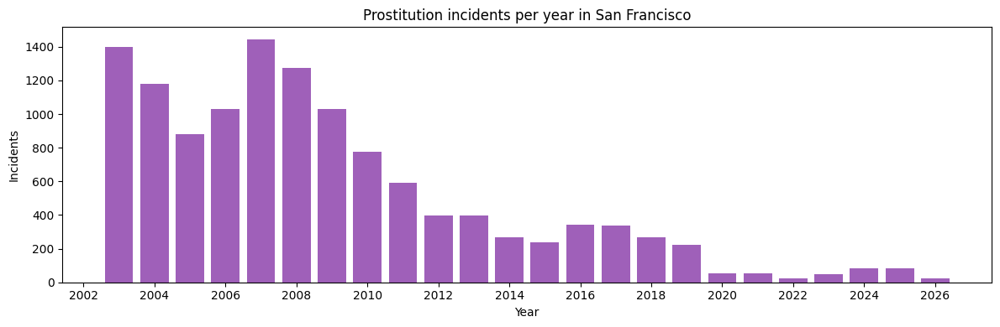

Peak: 2007 with 1,445 incidents
Recent years:
 Year  count
 2020     55
 2021     51
 2022     24
 2023     49
 2024     84
 2025     83
 2026     24


In [18]:
# ── Temporal trend: yearly counts ──────────────────────────────────
yearly = prost.groupby("Year").size().reset_index(name="count")

fig, ax = plt.subplots(figsize=(12, 4))
ax.bar(yearly["Year"], yearly["count"], color="#8e44ad", alpha=0.85)
ax.set_xlabel("Year")
ax.set_ylabel("Incidents")
ax.set_title("Prostitution incidents per year in San Francisco")
ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
plt.tight_layout()
plt.show()

# Highlight the dramatic drop
peak_year = yearly.loc[yearly["count"].idxmax()]
recent = yearly[yearly["Year"] >= 2020]
print(f"Peak: {int(peak_year['Year'])} with {peak_year['count']:,} incidents")
print("Recent years:")
print(recent.to_string(index=False))

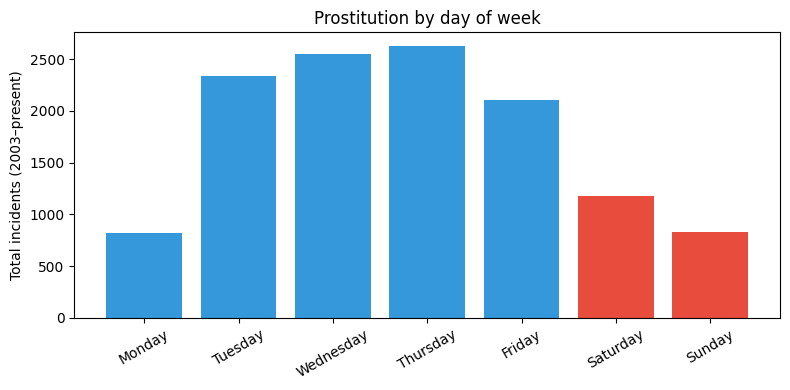

In [ ]:
# ── Day-of-week pattern ───────────────────────────────────────────
day_order = [
    "Monday",
    "Tuesday",
    "Wednesday",
    "Thursday",
    "Friday",
    "Saturday",
    "Sunday",
]
dow_counts = prost["Incident Day of Week"].value_counts().reindex(day_order)

fig, ax = plt.subplots(figsize=(8, 4))
colors = ["#3498db"] * 5 + ["#e74c3c"] * 2  # weekdays blue, weekend red
ax.bar(dow_counts.index, dow_counts.values, color=colors)
ax.set_ylabel("Total incidents (2003-present)")
ax.set_title("Prostitution by day of week")
plt.xticks(rotation=30)
plt.tight_layout()
plt.show()

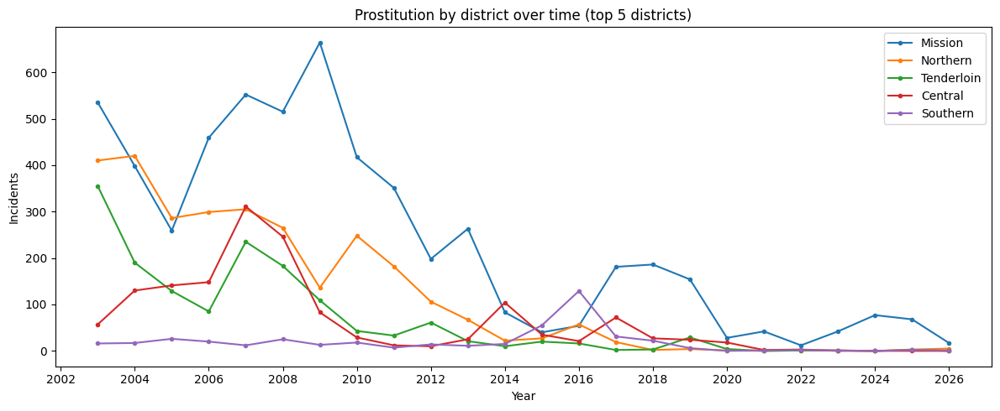

In [20]:
# ── Per-district yearly trends ────────────────────────────────────
# Top 5 districts by total volume
top_districts = prost["Police District"].value_counts().head(5).index.tolist()

fig, ax = plt.subplots(figsize=(12, 5))
for district in top_districts:
    district_yearly = (
        prost[prost["Police District"] == district]
        .groupby("Year")
        .size()
        .reindex(yearly["Year"], fill_value=0)
    )
    ax.plot(
        district_yearly.index,
        district_yearly.values,
        marker="o",
        markersize=3,
        label=district,
    )

ax.set_xlabel("Year")
ax.set_ylabel("Incidents")
ax.set_title("Prostitution by district over time (top 5 districts)")
ax.legend()
ax.xaxis.set_major_locator(ticker.MultipleLocator(2))
plt.tight_layout()
plt.show()

In [21]:
# ── Choropleth comparison: 2003-2012 vs 2013-present ─────────────
early = prost[prost["Year"] <= 2012]
late = prost[prost["Year"] > 2012]


def district_counts(df):
    counts = df.groupby("Police District").size().reset_index(name="count")
    counts["district"] = counts["Police District"].str.upper()
    return counts


early_counts = district_counts(early)
late_counts = district_counts(late)

# Use same color scale max for fair comparison
shared_max = max(early_counts["count"].max(), late_counts["count"].max())

fig_early = px.choropleth_map(
    early_counts,
    geojson=geojson,
    color="count",
    locations="district",
    featureidkey="properties.DISTRICT",
    map_style="open-street-map",
    center={"lat": 37.76, "lon": -122.44},
    zoom=11.3,
    opacity=0.6,
    title="Prostitution 2003-2012",
    range_color=[0, shared_max],
    color_continuous_scale="Reds",
)
fig_early.update_layout(margin=dict(l=0, r=0, t=40, b=0), height=450)
fig_early.show()

fig_late = px.choropleth_map(
    late_counts,
    geojson=geojson,
    color="count",
    locations="district",
    featureidkey="properties.DISTRICT",
    map_style="open-street-map",
    center={"lat": 37.76, "lon": -122.44},
    zoom=11.3,
    opacity=0.6,
    title="Prostitution 2013–present",
    range_color=[0, shared_max],
    color_continuous_scale="Reds",
)
fig_late.update_layout(margin=dict(l=0, r=0, t=40, b=0), height=450)
fig_late.show()

Top 10 most-repeated coordinates:
 Latitude   Longitude   n
37.760433 -122.415930 552
37.784450 -122.416075 468
37.784450 -122.416075 408
37.763634 -122.416230 378
37.763634 -122.416230 354
37.762099 -122.415001 335
37.787037 -122.418274 327
37.787486 -122.418369 325
37.787965 -122.418468 305
37.758697 -122.417964 256

1378 unique coordinate pairs for 12,459 incidents
Top 10 coordinates account for 3,708 incidents (29.8% of total)


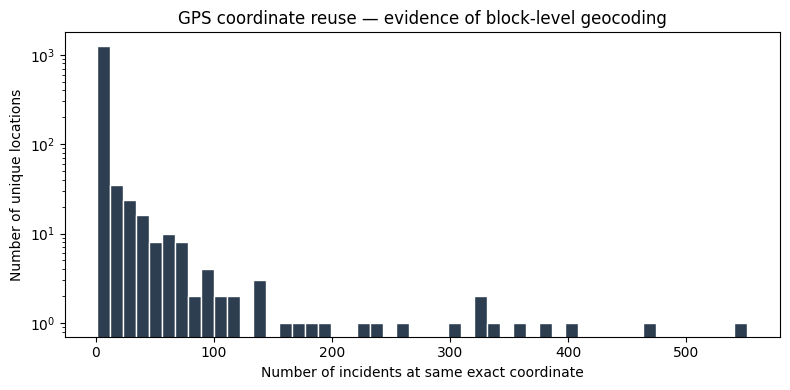

In [22]:
# ── Data quality: GPS coordinate precision ────────────────────────
# Many incidents share exact same coordinates → block-level or
# station-level geocoding, not precise GPS
coord_counts = (
    prost.groupby(["Latitude", "Longitude"])
    .size()
    .reset_index(name="n")
    .sort_values("n", ascending=False)
)

print("Top 10 most-repeated coordinates:")
print(coord_counts.head(10).to_string(index=False))
print(f"\n{len(coord_counts)} unique coordinate pairs for {len(prost):,} incidents")
print(
    f"Top 10 coordinates account for {coord_counts.head(10)['n'].sum():,} incidents "
    f"({coord_counts.head(10)['n'].sum() / len(prost) * 100:.1f}% of total)"
)

# Histogram of coordinate reuse
fig, ax = plt.subplots(figsize=(8, 4))
ax.hist(coord_counts["n"], bins=50, color="#2c3e50", edgecolor="white")
ax.set_xlabel("Number of incidents at same exact coordinate")
ax.set_ylabel("Number of unique locations")
ax.set_title("GPS coordinate reuse — evidence of block-level geocoding")
ax.set_yscale("log")
plt.tight_layout()
plt.show()

### Reflection: data errors and feedback loops

**Data errors observed:**
- **GPS precision:** Many incidents map to the exact same coordinate — likely block-centroid or intersection-level geocoding rather than true GPS. This creates artificial hotspots in point-scatter and heatmap views that reflect *recording conventions* rather than actual spatial clustering.
- **Temporal recording gaps:** Some quarters have zero incidents — this could be genuine (no arrests) or an artefact of reporting-system transitions between the legacy and new SFPD databases.

**Feedback loops and predictive policing:**
- If police deploy more officers to the hotspots we identified (e.g. parts of Mission, Northern, Tenderloin), they will *arrest more people in those areas*, generating more data points there — even if the underlying behaviour is equally prevalent elsewhere.
- This is exactly the feedback loop described by Richardson et al.: historical arrest data reflects *where police chose to look*, not where crime actually occurs. A model trained on this data will recommend more policing in the same areas, amplifying existing biases.
- Prostitution is an especially clear example: it is largely a *proactive* arrest category (police initiate the encounter), so the data almost entirely reflects deployment patterns rather than civilian reports.
- The dramatic drop in incidents after ~2015 likely reflects a policy shift (de-prioritisation of prostitution enforcement) rather than a true change in behaviour — a reminder that crime *data* and crime *reality* are very different things.

---

## You've Completed Week 5!

This week was all about the geospatial dimension of the SF crime data — an aspect we've mostly set aside until now. You now have:

- Experience creating choropleth maps from GeoJSON shapefiles using Plotly
- Practice building interactive point scatter maps and heatmaps with Folium
- The ability to animate temporal patterns using `HeatMapWithTime`
- A complete, multi-method spatio-temporal analysis that draws on everything you've learned across the course

**Key takeaways:**
- Geospatial data opens up a whole new dimension of analysis. *Where* crimes happen is often as revealing as *when* or *how many*.
- The same data can look very different depending on your visualization choices — choropleth maps show district-level summaries, point scatter maps show individual events, and heatmaps reveal density patterns.
- Perceptual choices matter: the color scale, zoom level, and time window you choose can either reveal or obscure real patterns.
- Spatio-temporal analysis (combining *where* and *when*) is one of the most powerful tools for understanding crime — and one of the most susceptible to misuse when the patterns it reveals are used to justify more policing in the same areas.

If you want to go further:
- Try creating choropleth maps for your full set of Personal Focus Crimes side-by-side — which crimes are most geographically concentrated?
- Experiment with `HeatMapWithTime` at different time resolutions for the same crime type — does the weekly or monthly view tell a different story than the daily one?
- Think about what the hotspots you found in Part 3 would mean for a predictive policing system trained on this data. Does anything from the Week 1 readings feel relevant?